In [2]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
from coffea import util
from coffea.processor import accumulate
import os
import re
import pandas as pd
import hist
import sys
sys.path.append("/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools")
import plotTools as ptools

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
f_sig = "/uscms_data/d3/sbrightt/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/outputs/sig/signal_2018_aEM_SR_studies.coffea"
f_qcd = "/uscms_data/d3/sbrightt/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/outputs/bkg/bkg_2018_QCD_TuneCP5_PSWeights_SR_studies.coffea"
sig = util.load(f_sig)[0]
qcd = util.load(f_qcd)[0]

In [4]:
cutflows = ['cutDesc', 'cutflow', 'cutflow_cts']
histos = [k for k in sig.keys() if k not in cutflows]
sig_samples = list(sig['cutflow'].keys())
qcd_samples = list(qcd['cutflow'].keys())
si = pd.DataFrame.from_dict({s:ptools.signalPoint(s) for s in sig_samples},orient='index')
cuts = list(sig['cutflow'][sig_samples[0]].keys())
cutNames = {cname:ptools.getCut(sig['cutDesc'][cname]) for cname in sig['cutDesc'].keys()}
deltas = sorted(list(set(si.delta)))
ctaus = sorted(list(set(si.ctau)))

In [5]:
cut = "cut11"

In [9]:
def makeEffPlot(hname,xlim,cut="cut11",loc='best',logy=False,logx=False,tickx=None,lessThan=True,xlabel=None):
    # vertex chi2
    hb = qcd[hname][sum,cut,:]
    varAx = hb.axes[-1]
    for delta in deltas:
        plt.figure(figsize=(16,4))
        m1s = sorted(list(set(si[si.delta==delta].m1)))
        for i,ct in enumerate(ctaus):
            plt.subplot(1,4,i+1)
            plt.title(r"$c\tau = {0}$ mm".format(ct))
            xb,effb,ctsb = ptools.makeCutEff(hb,lessThan=lessThan)
            plt.plot(xb,effb,'o-',markersize=4,label="QCD")
            for m1 in m1s:
                point = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
                hs = sig[hname][point,cut,:]
                x,eff,cts = ptools.makeCutEff(hs,lessThan=lessThan)
                plt.plot(x,eff,'o-',markersize=4,label=r"$M_1 = {0}$".format(m1))
            plt.ylim([0,1])
            plt.xlim(xlim)
            if xlabel:
                plt.xlabel(xlabel)
            else:
                plt.xlabel(f"{varAx.label}")
            if logy:
                plt.yscale('log')
            if logx:
                plt.xscale('log')
            if tickx:
                plt.xticks(ticks=np.arange(xlim[0],xlim[1]+tickx,tickx),rotation=45)
            plt.grid()
            if i==0:
                plt.ylabel("Efficiency")
                plt.legend(loc=loc)
        plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
        plt.tight_layout()
        if lessThan:
            plt.savefig(f"plots/efficiencies/{hname}_delta{delta:.1f}.pdf")
        else:
            plt.savefig(f"plots/efficiencies/{hname}_delta{delta:.1f}_greaterThan.pdf")

# Vertex Isolation

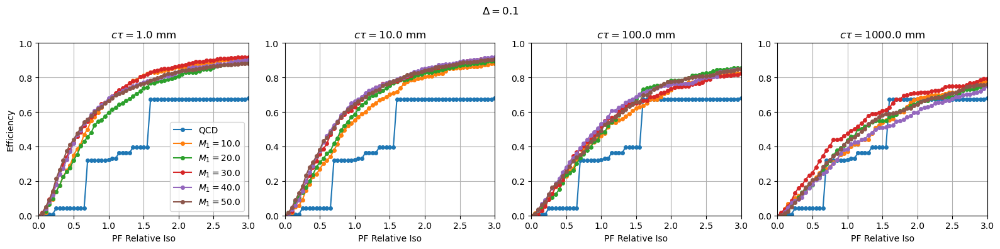

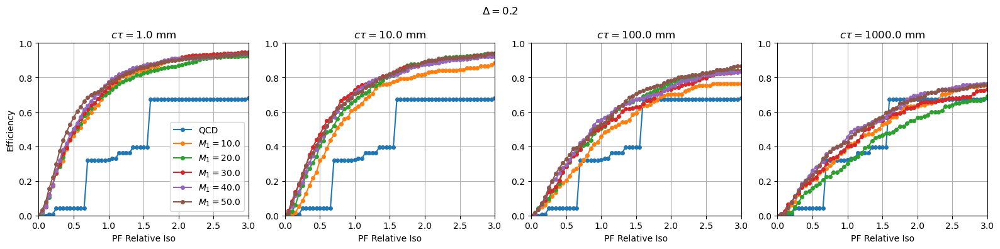

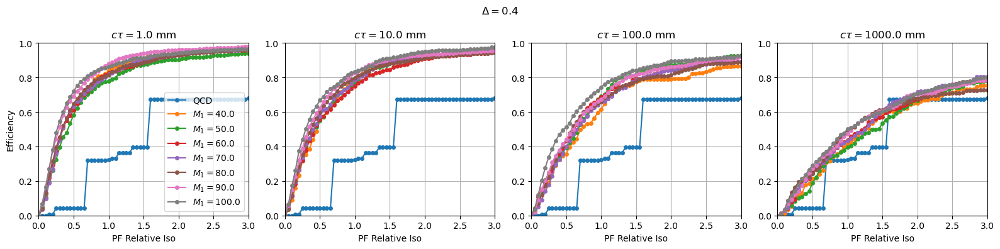

In [102]:
# vertex PFRelIso3
hname = "sel_vtx_PFRelIso3"
makeEffPlot(hname,[0,3],loc='lower right')

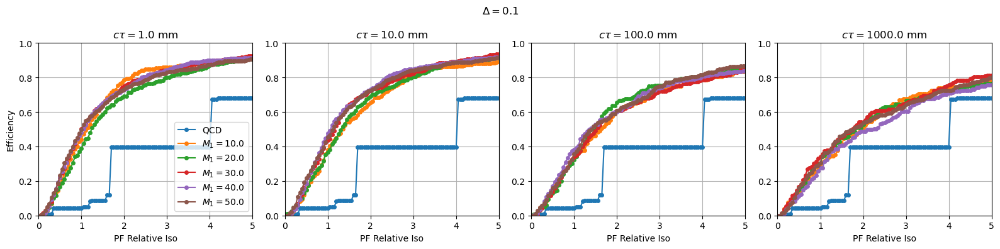

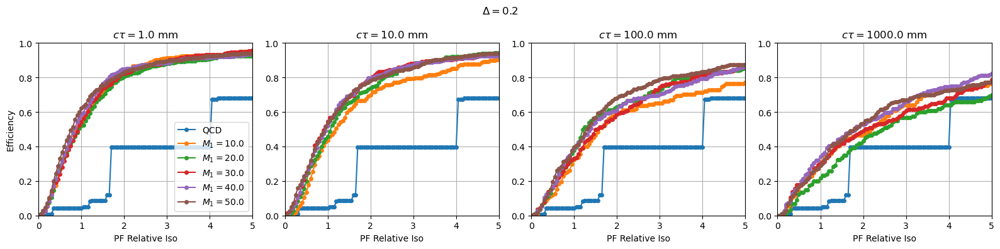

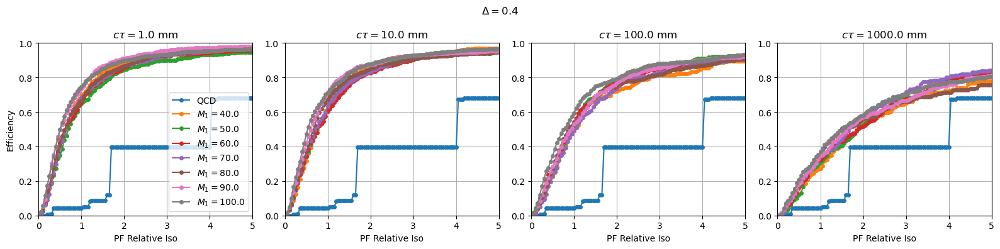

In [104]:
# vertex PFRelIso4
hname = "sel_vtx_PFRelIso4"
makeEffPlot(hname,[0,5],loc='lower right')

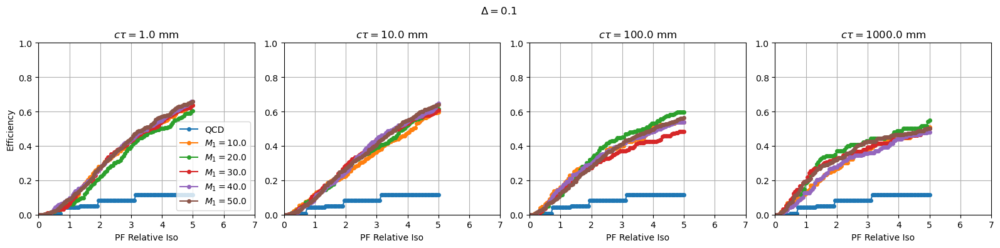

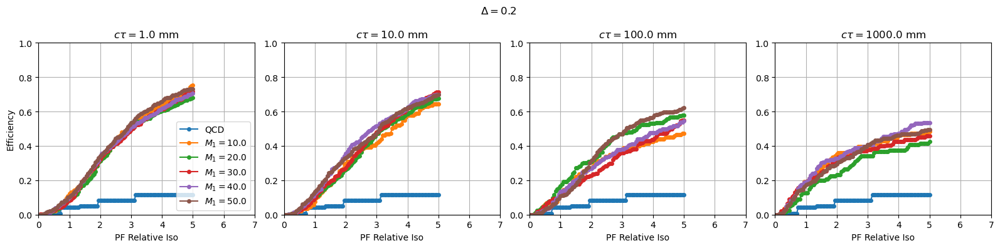

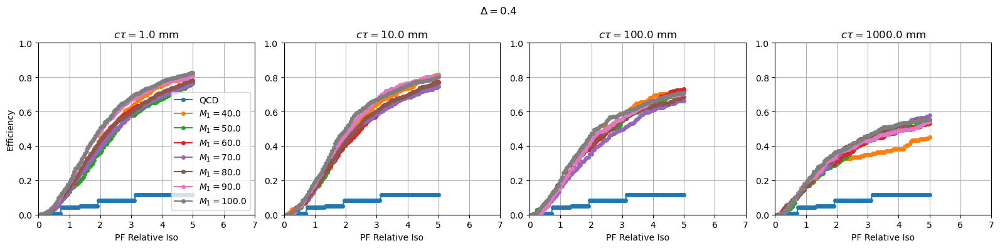

In [105]:
# vertex PFRelIso8
hname = "sel_vtx_PFRelIso8"
makeEffPlot(hname,[0,7],loc='lower right')

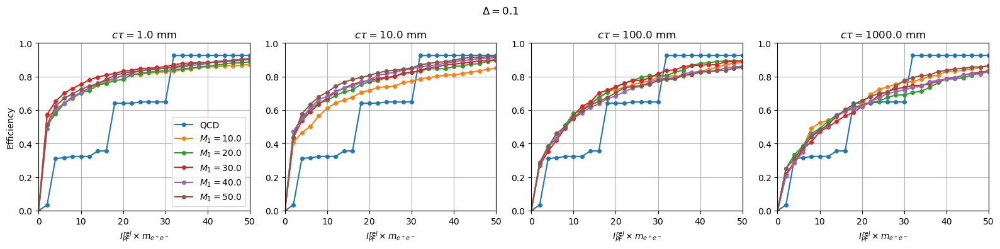

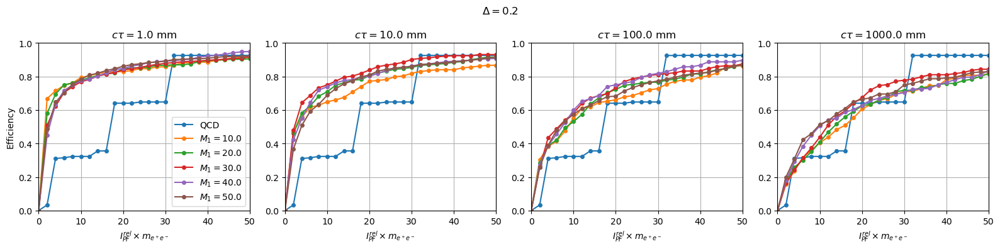

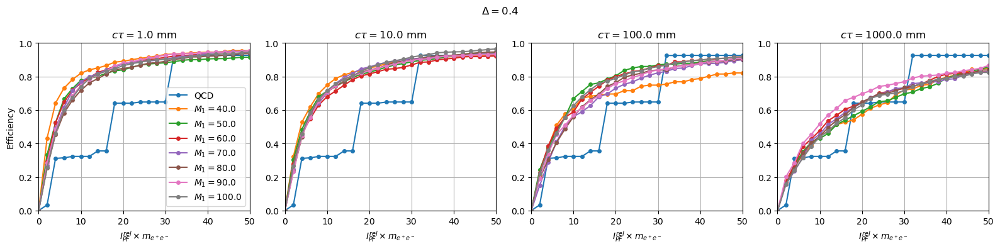

In [8]:
# vertex PFRelIso3 * mass
hname = "sel_vtx_PFRelIso3M"
makeEffPlot(hname,[0,50],loc='lower right')

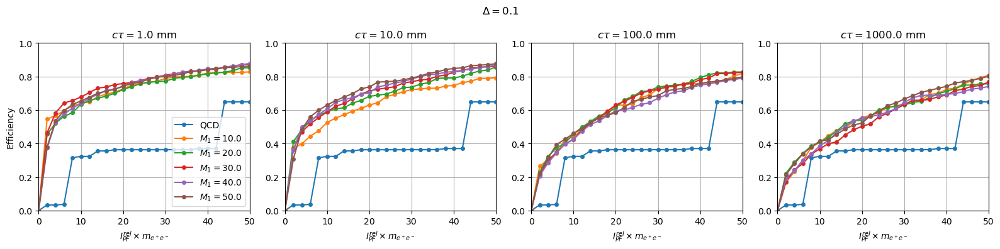

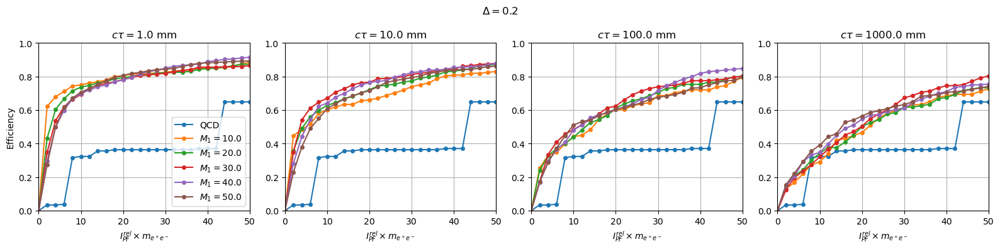

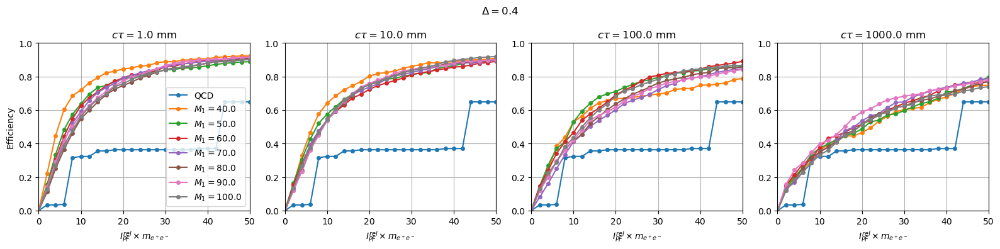

In [21]:
# vertex PFRelIso4 * mass
hname = "sel_vtx_PFRelIso4M"
makeEffPlot(hname,[0,50],loc='lower right')

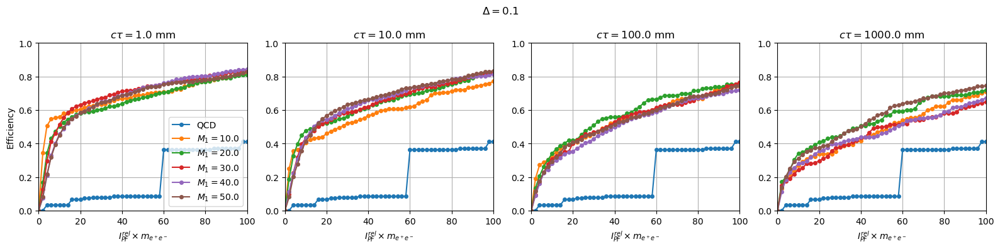

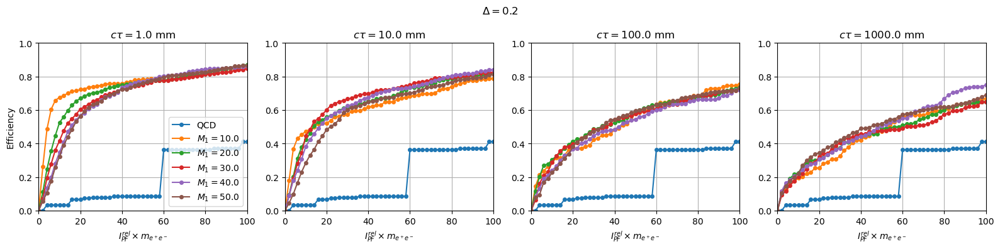

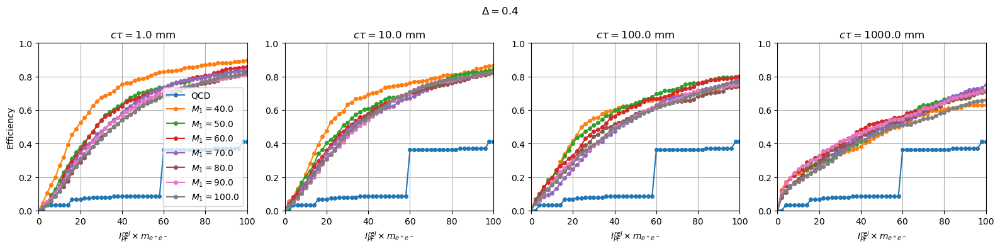

In [23]:
# vertex PFRelIso8 * mass
hname = "sel_vtx_PFRelIso8M"
makeEffPlot(hname,[0,100],loc='lower right')

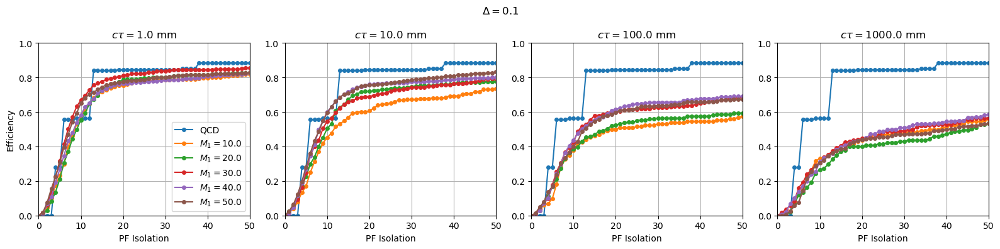

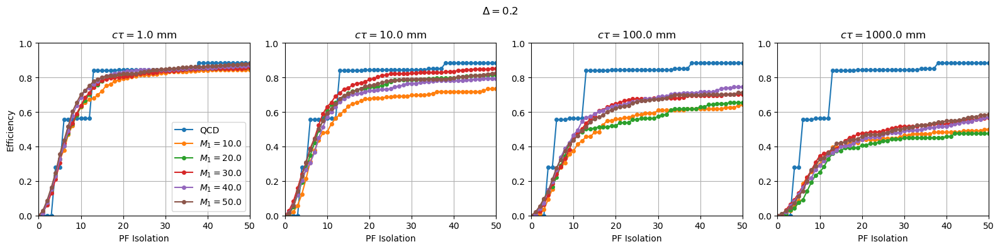

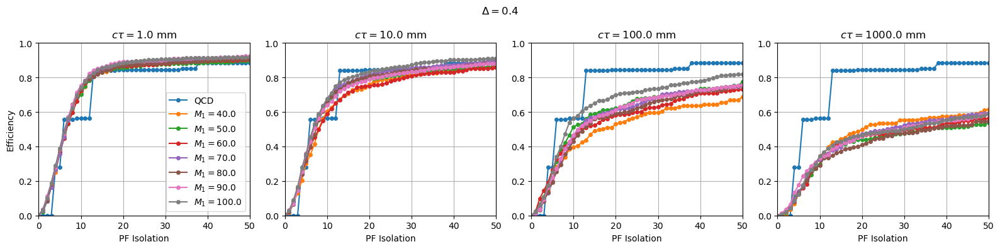

In [12]:
# vertex PFIso3
hname = "sel_vtx_PFIso3"
makeEffPlot(hname,[0,50],loc='lower right')

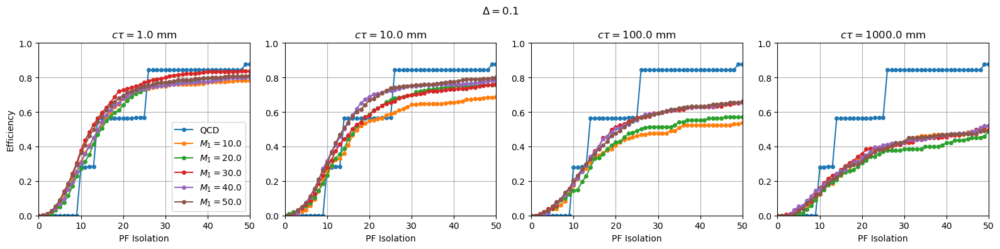

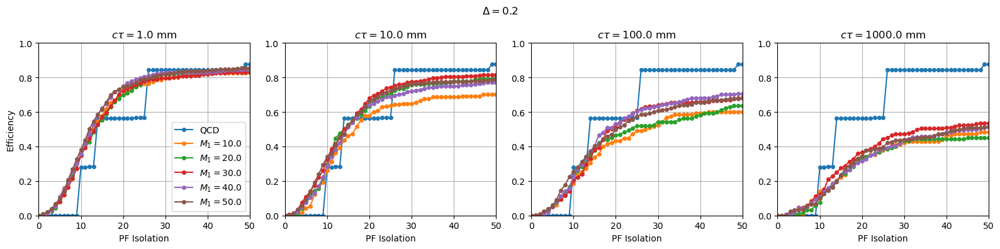

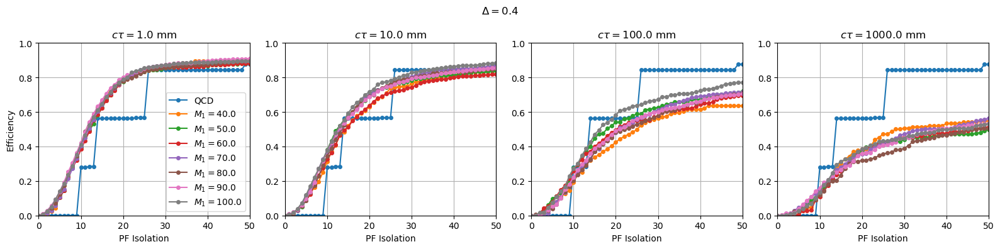

In [13]:
# vertex PFIso4
hname = "sel_vtx_PFIso4"
makeEffPlot(hname,[0,50],loc='lower right')

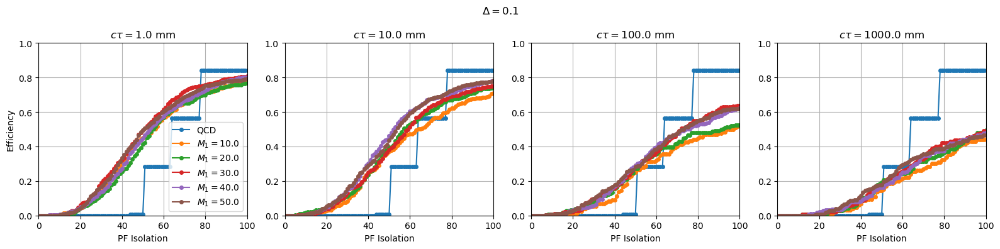

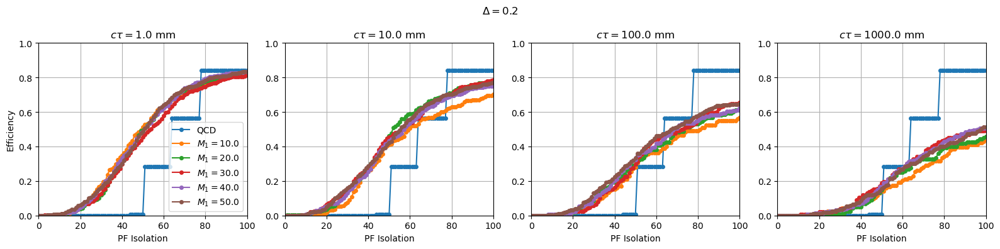

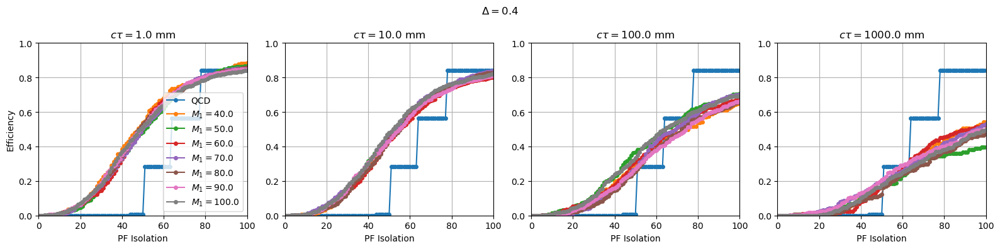

In [15]:
# vertex PFIso8
hname = "sel_vtx_PFIso8"
makeEffPlot(hname,[0,100],loc='lower right')

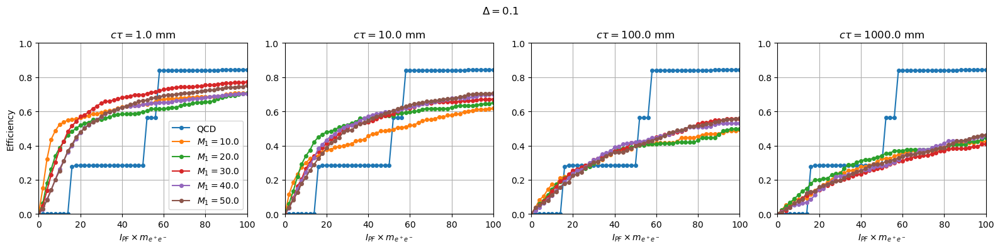

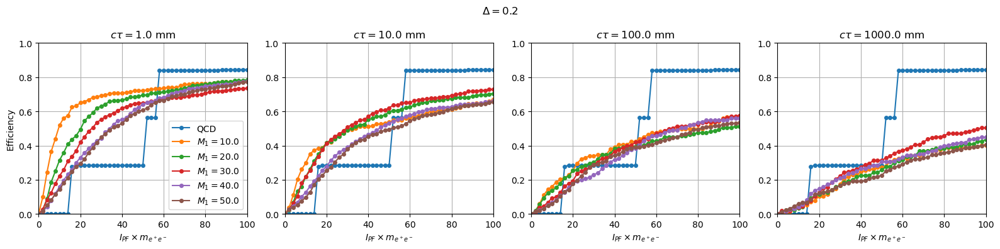

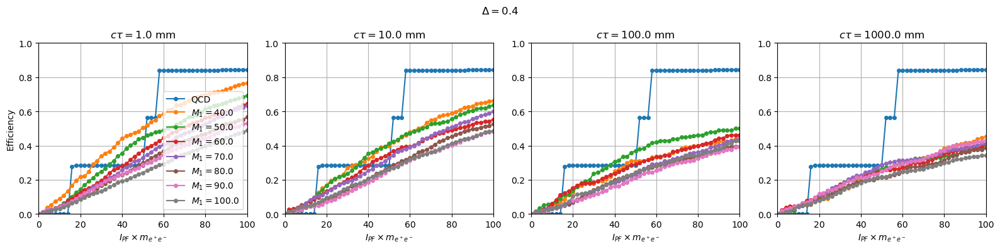

In [19]:
# vertex PFIso3 * mass
hname = "sel_vtx_PFIso3M"
makeEffPlot(hname,[0,100],loc='lower right')

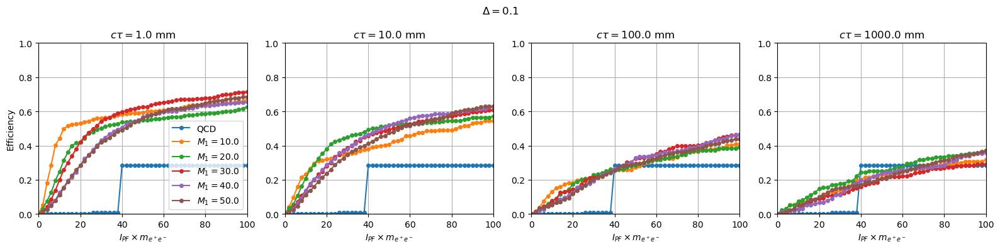

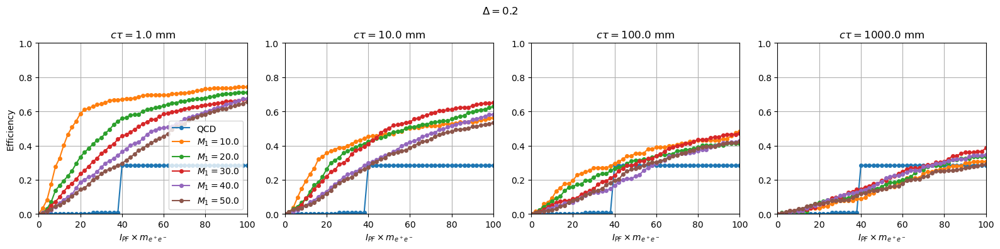

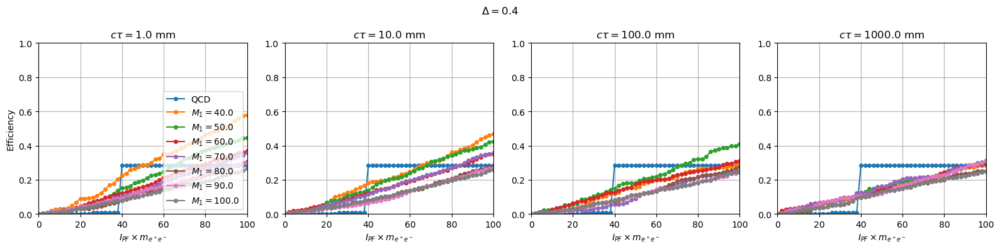

In [20]:
# vertex PFIso4 * mass
hname = "sel_vtx_PFIso4M"
makeEffPlot(hname,[0,100],loc='lower right')

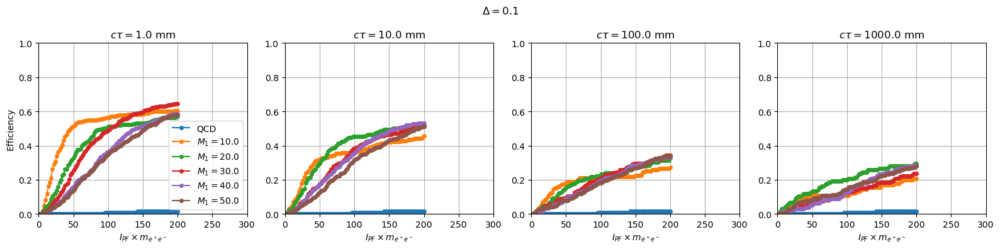

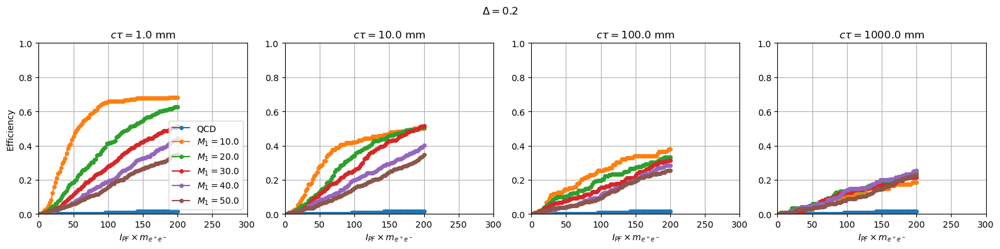

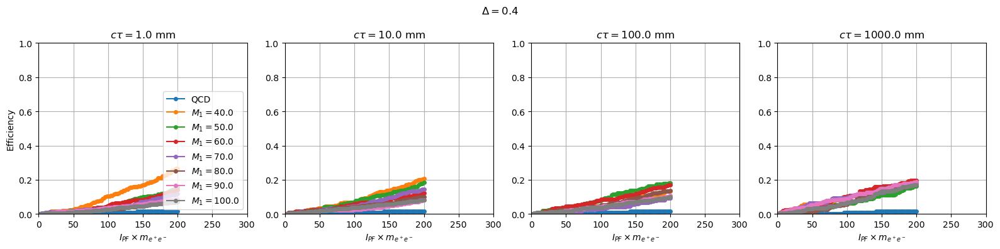

In [25]:
# vertex PFIso8 * mass
hname = "sel_vtx_PFIso8M"
makeEffPlot(hname,[0,300],loc='lower right')

# Vertex Quality

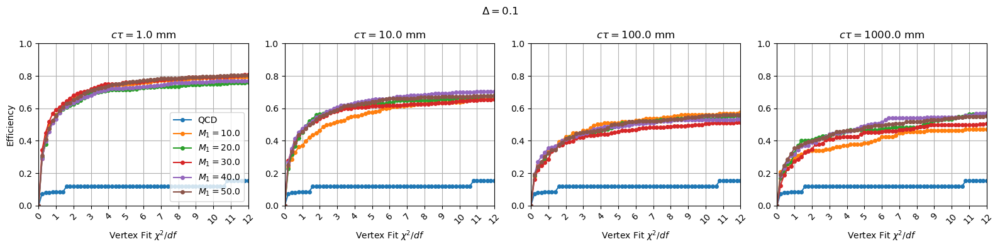

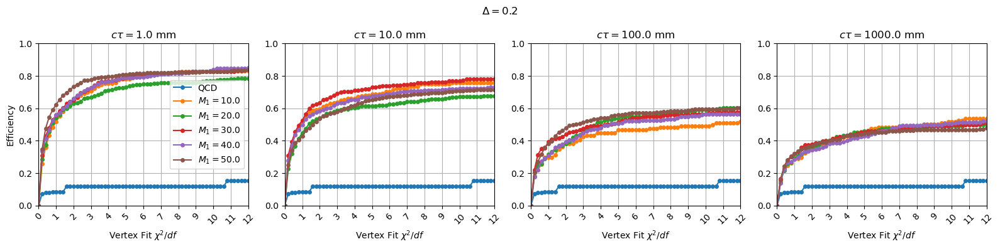

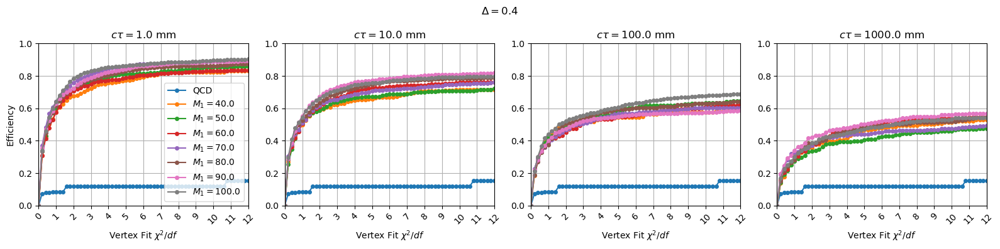

In [26]:
# vertex chi2
hname = "sel_vtx_chi2"
makeEffPlot(hname,[0,12],tickx=1)

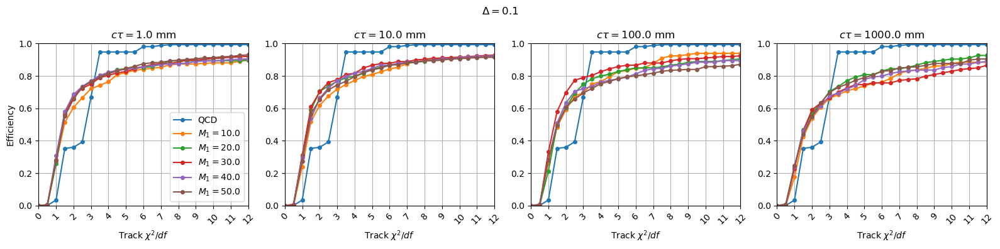

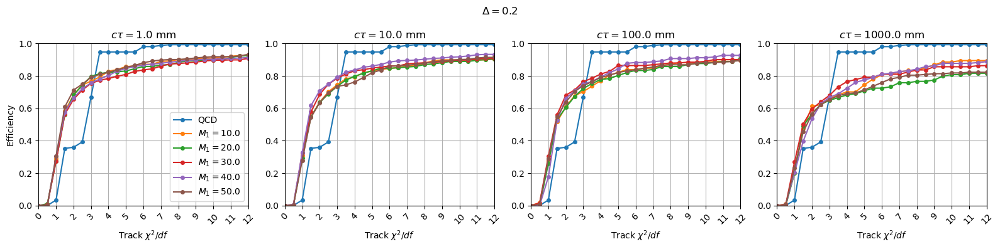

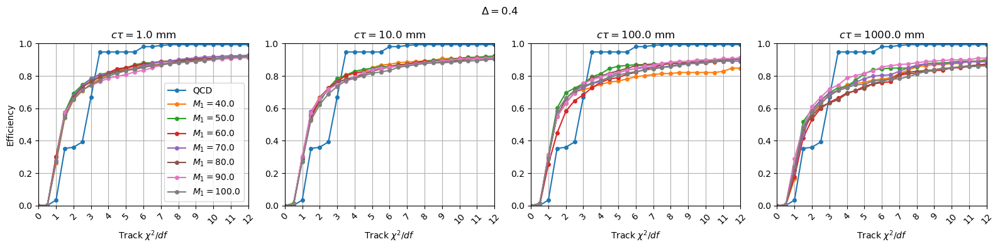

In [27]:
# vertex chi2
hname = "sel_vtx_max_chi2"
makeEffPlot(hname,[0,12],tickx=1)

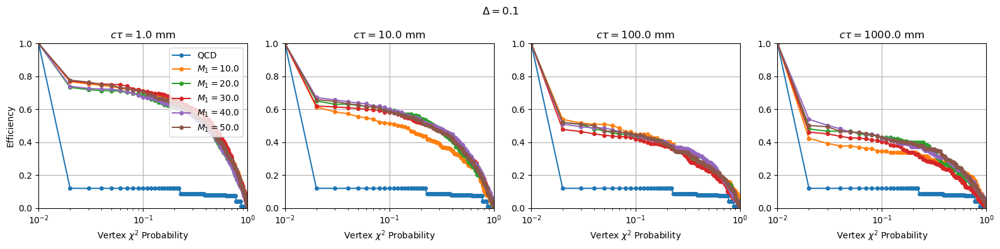

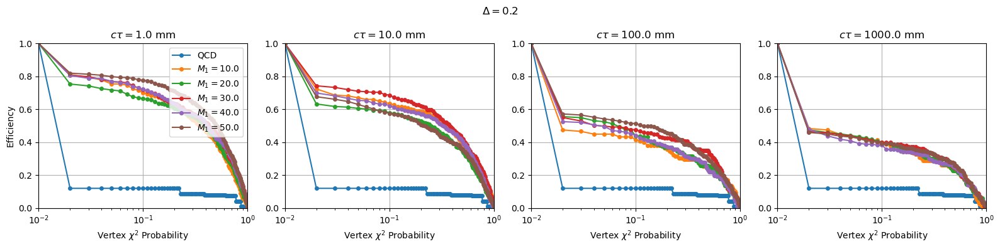

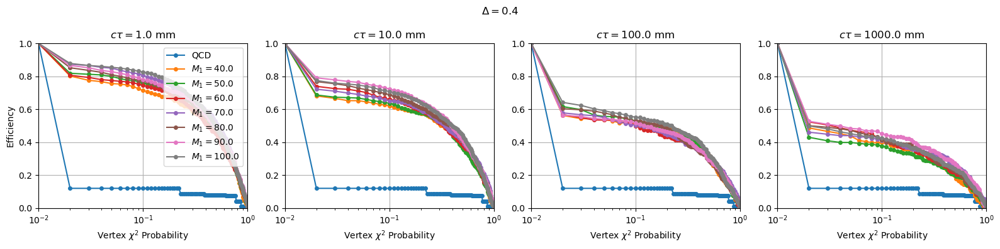

In [84]:
# electron 1 track chi2
hname = "sel_vtx_prob"
makeEffPlot(hname,[0.01,1],logx=True,lessThan=False,loc='upper right')

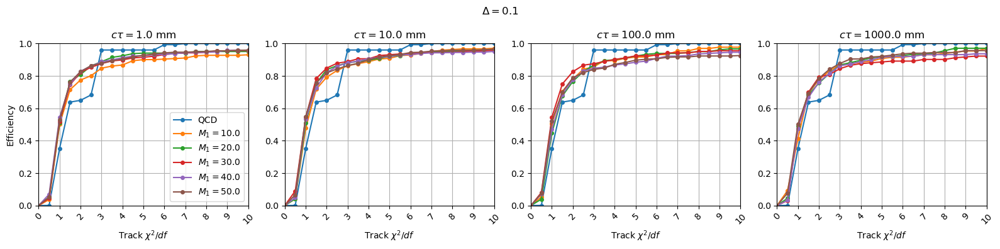

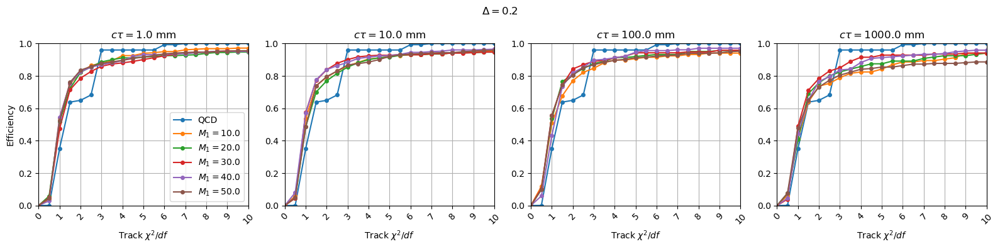

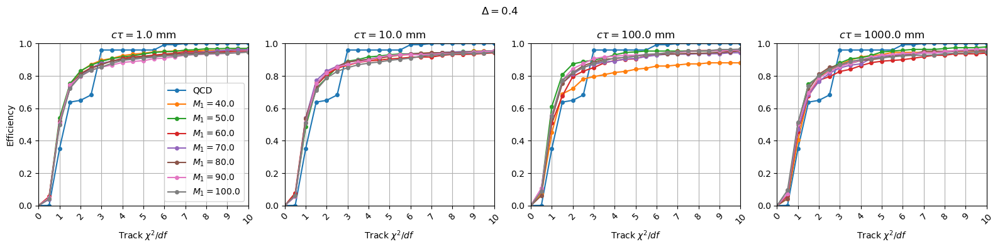

In [86]:
# electron 1 track chi2
hname = "sel_e1_trkChi2"
makeEffPlot(hname,[0,10],tickx=1)

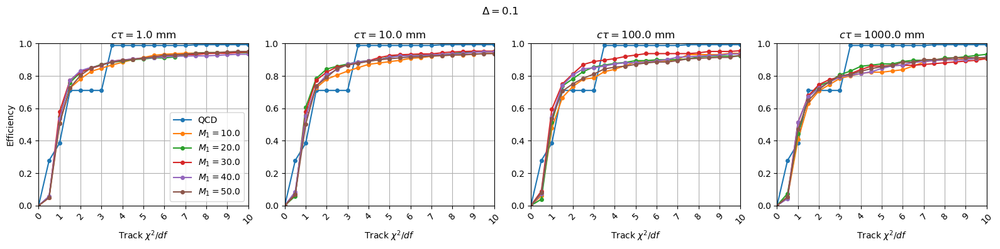

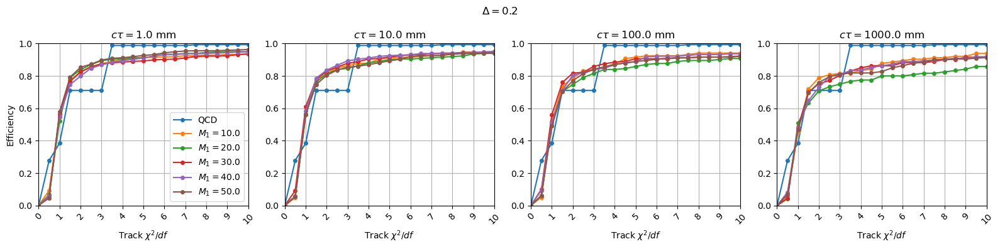

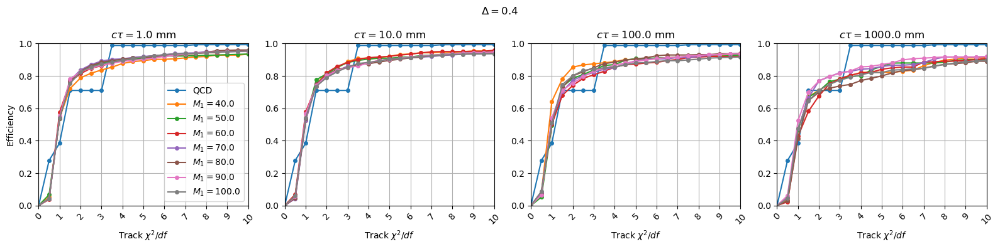

In [87]:
# electron 2 track chi2
hname = "sel_e2_trkChi2"
makeEffPlot(hname,[0,10],tickx=1)

# Vertex dR

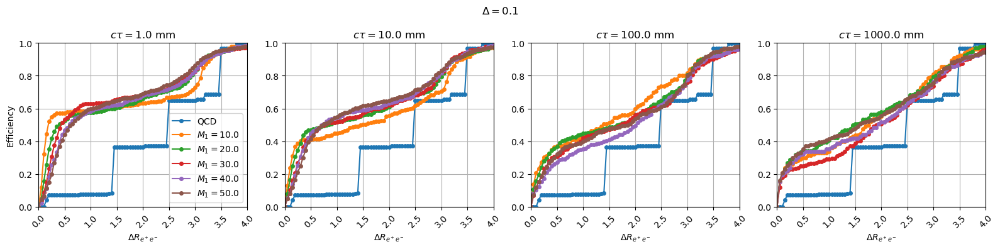

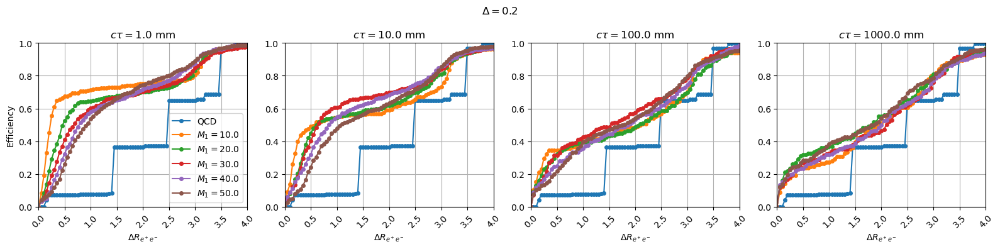

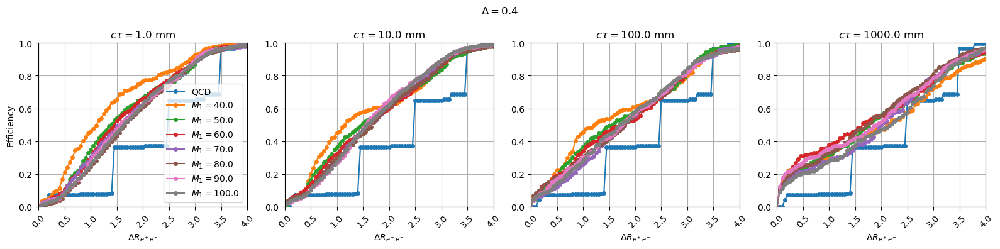

In [7]:
# vertex dR
hname = "sel_vtx_dR"
makeEffPlot(hname,[0,4],loc='lower right',tickx=0.5)

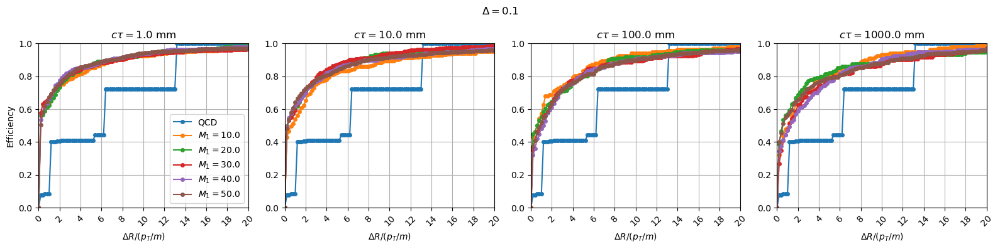

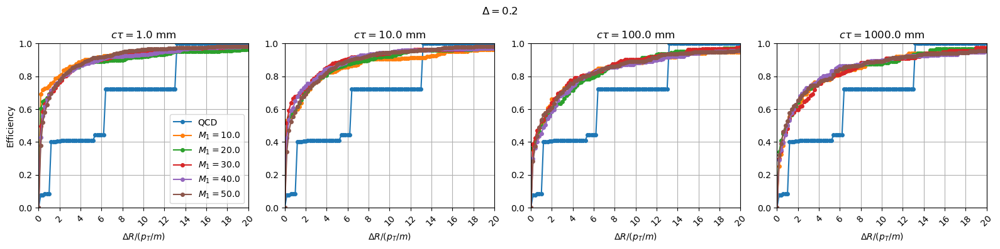

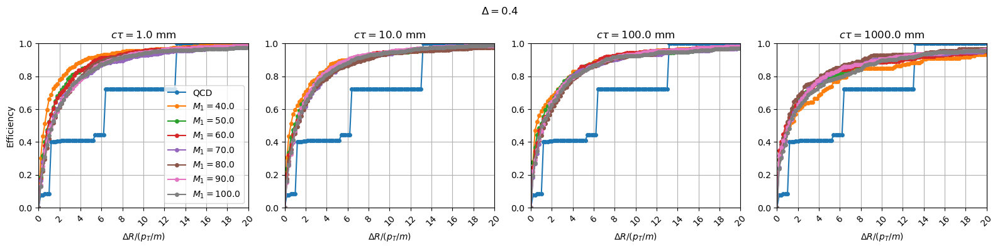

In [6]:
# dR / (pT/m)
hname = "sel_vtx_dR_over_pTm"
makeEffPlot(hname,[0,20],tickx=2)

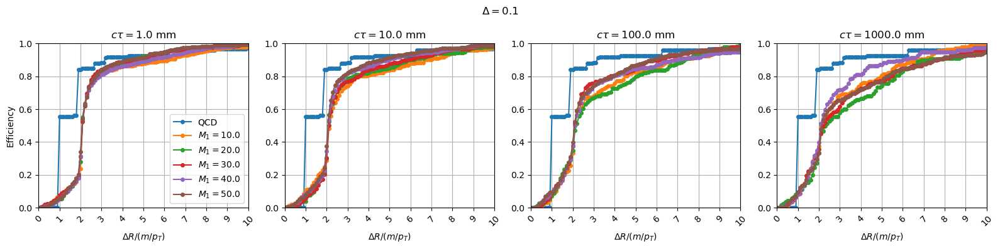

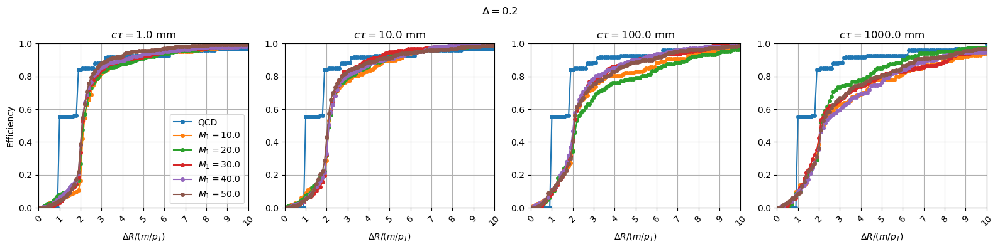

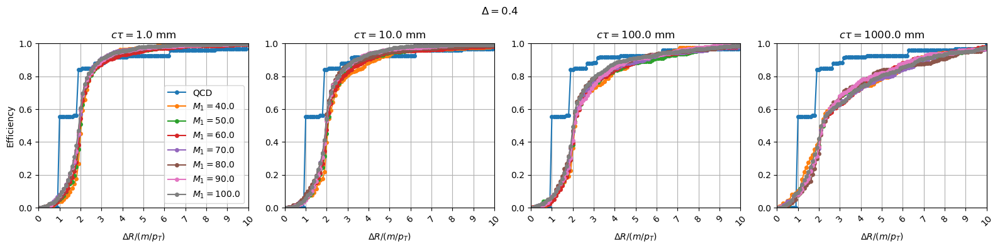

In [8]:
# dR / (m/pT)
hname = "sel_vtx_dR_over_mpT"
makeEffPlot(hname,[0,10],tickx=1,loc='lower right')

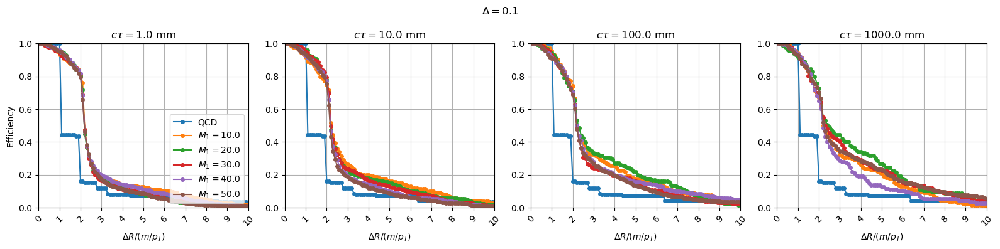

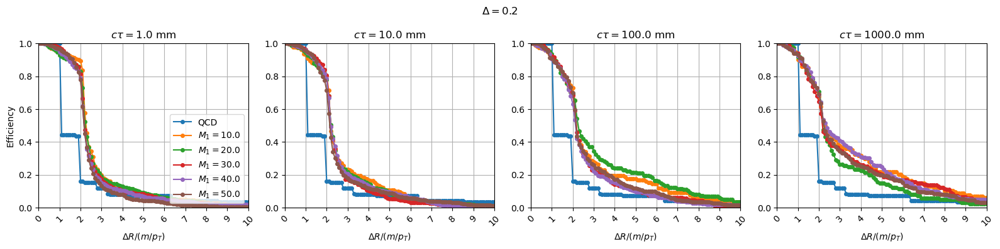

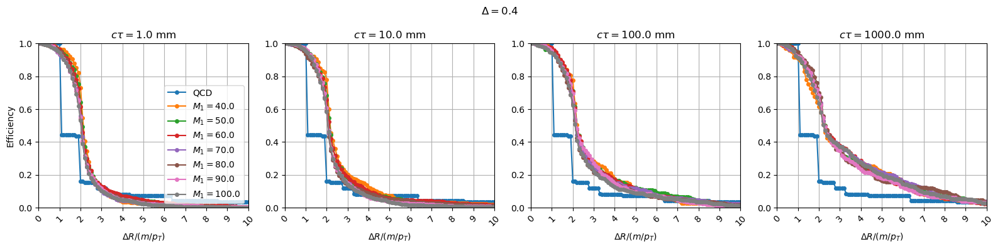

In [9]:
# dR / (m/pT) opposite cut
hname = "sel_vtx_dR_over_mpT"
makeEffPlot(hname,[0,10],tickx=1,loc='lower right',lessThan=False)

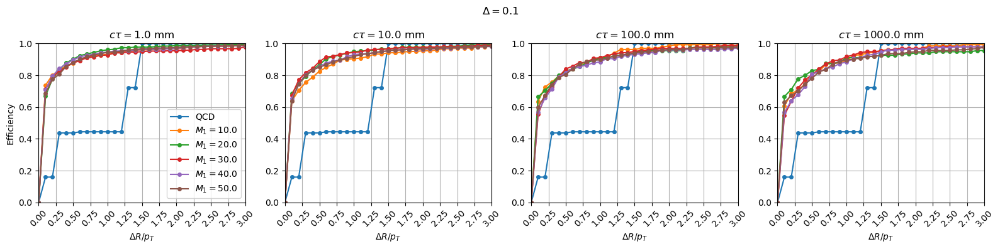

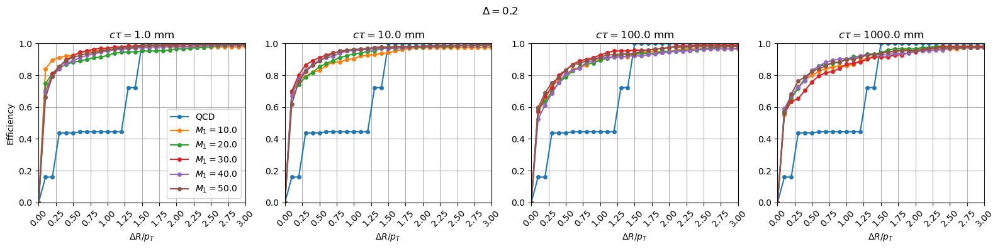

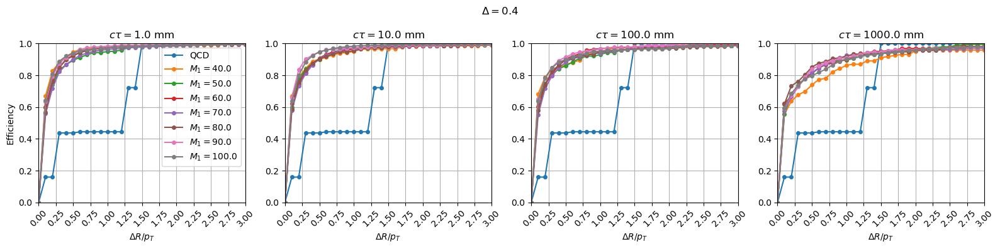

In [10]:
# dR/pT
hname = "sel_vtx_dR_over_pT"
makeEffPlot(hname,[0,3],tickx=0.25)

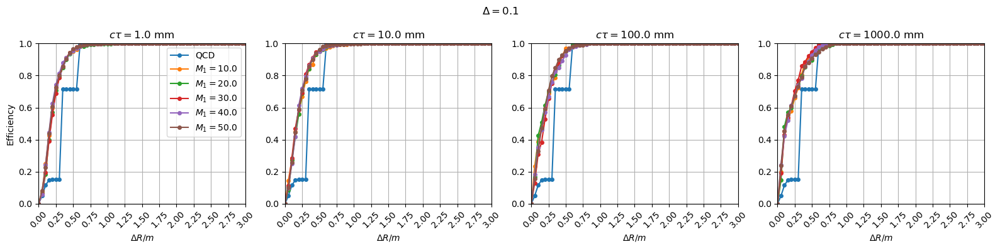

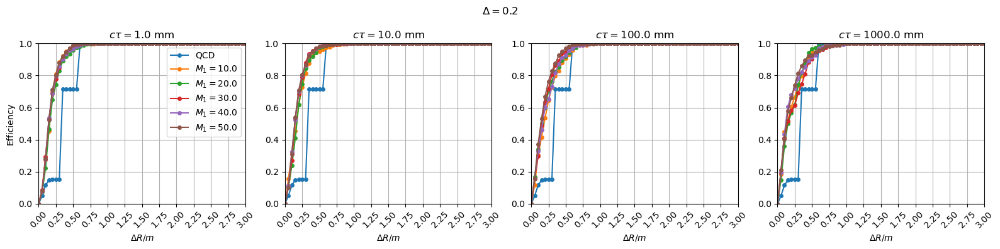

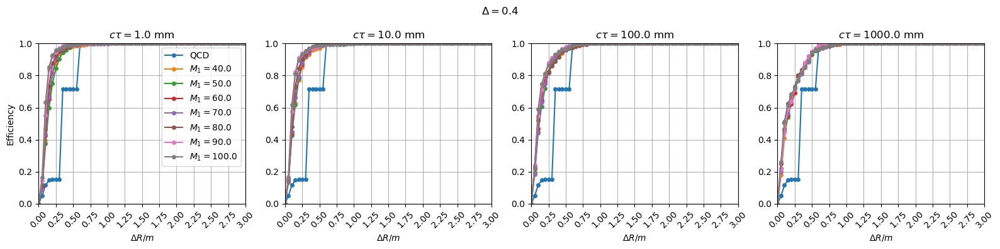

In [11]:
# dR/m
hname = "sel_vtx_dR_over_m"
makeEffPlot(hname,[0,3],tickx=0.25)

# Vertex-MET dPhi

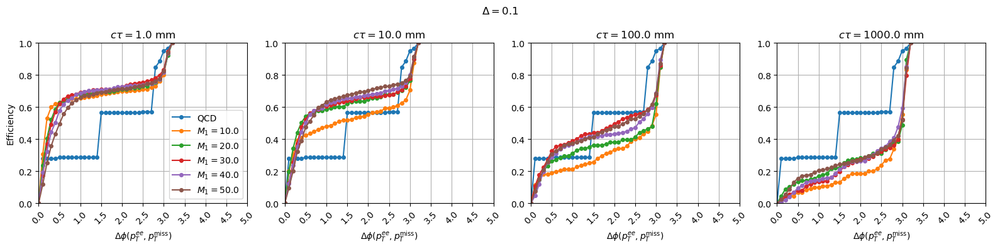

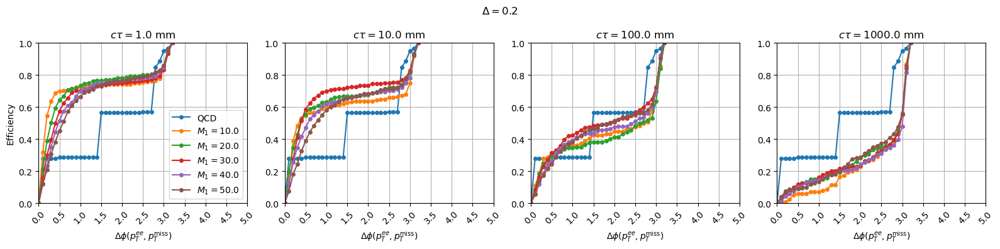

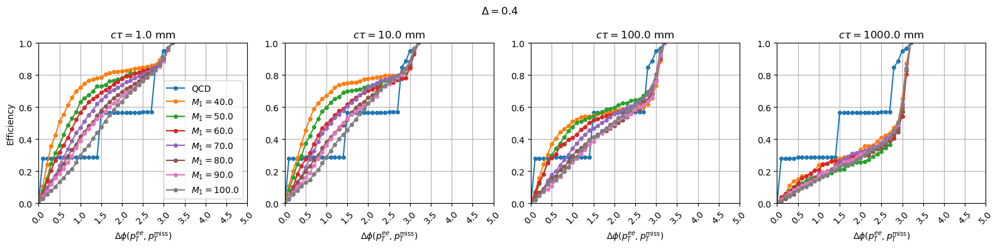

In [10]:
# vtx-MET dPhi
hname = "vtx_met_dPhi"
makeEffPlot(hname,[0,5],tickx=0.5,xlabel=r"$\Delta \phi(p_T^{ee},p_T^\mathrm{miss})$")

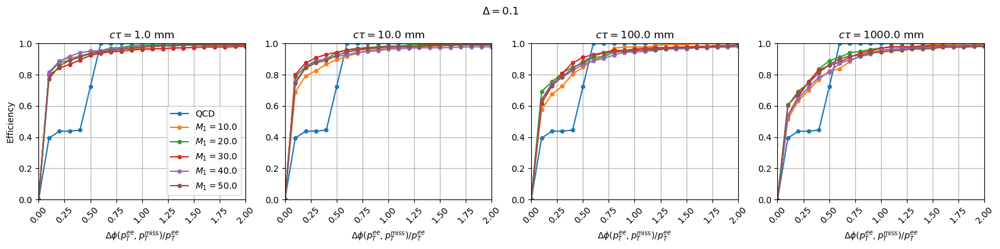

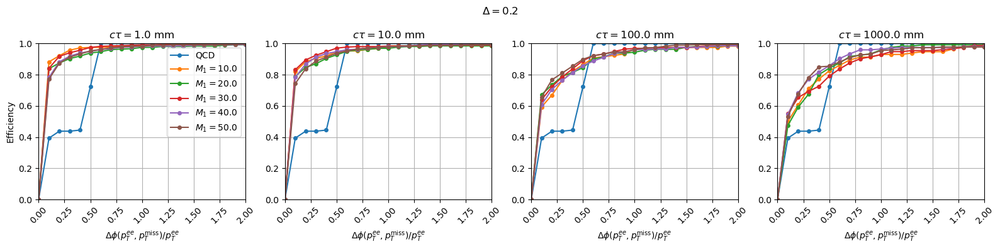

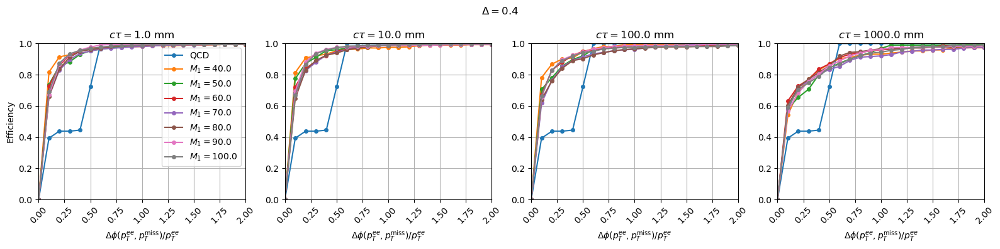

In [11]:
# vtx-MET dPhi / pT
hname = "sel_vtx_METdPhi_over_pT"
makeEffPlot(hname,[0,2],tickx=0.25,xlabel=r"$\Delta \phi(p_T^{ee},p_T^\mathrm{miss})/p_T^{ee}$")

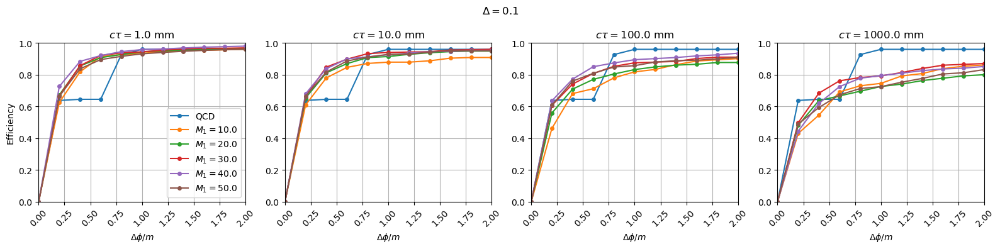

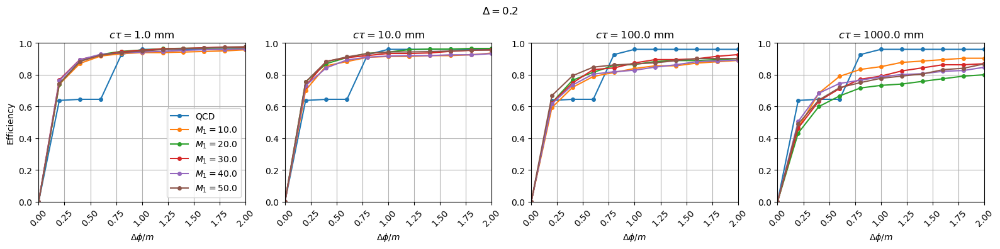

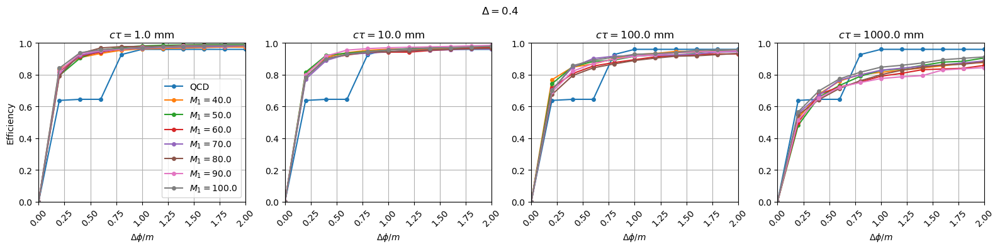

In [17]:
# vtx-MET dPhi / m
hname = "sel_vtx_METdPhi_over_m"
makeEffPlot(hname,[0,2],tickx=0.25)

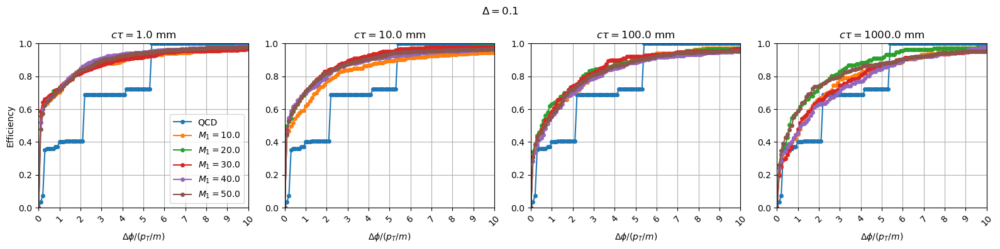

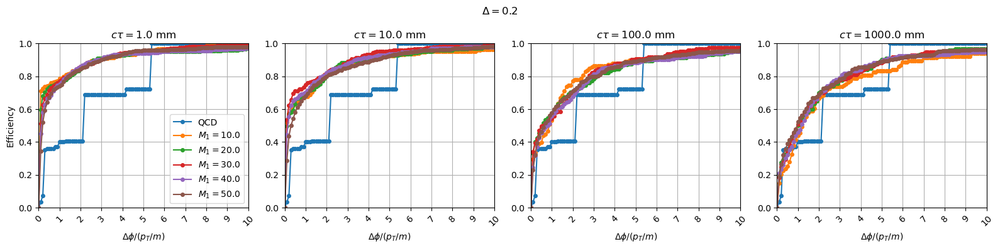

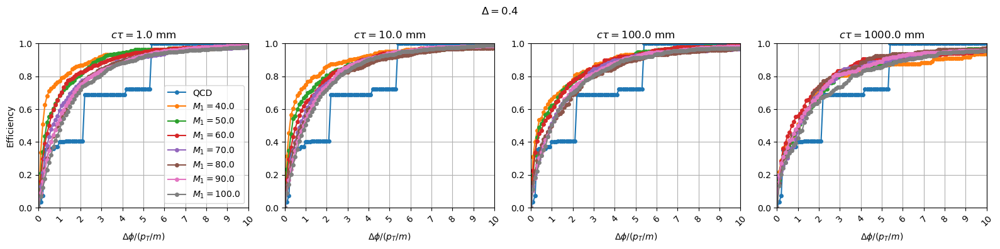

In [13]:
# vtx-MET dPhi / (pT/m)
hname = "sel_vtx_METdPhi_over_pTm"
makeEffPlot(hname,[0,10],tickx=1)

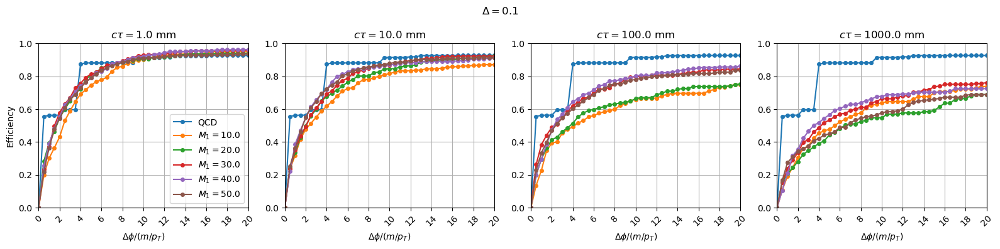

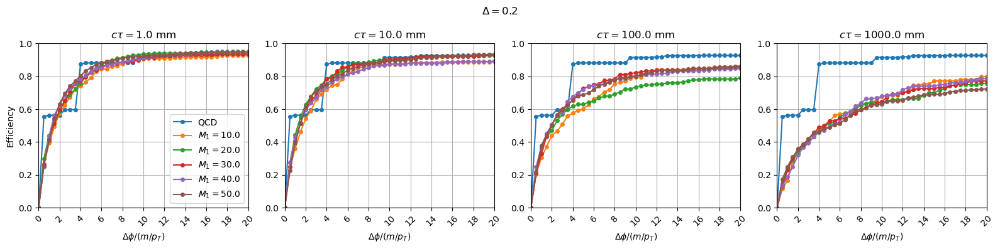

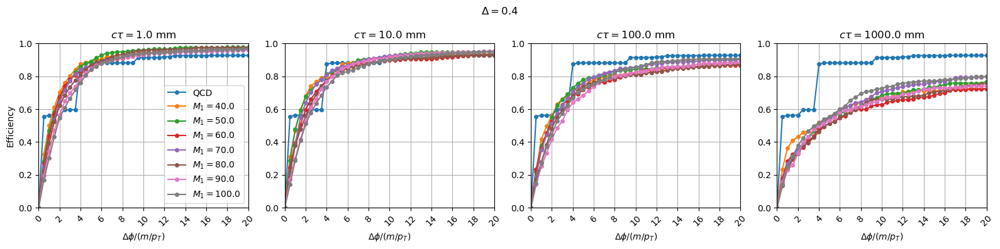

In [14]:
# vtx-MET dPhi / (m/pT)
hname = "sel_vtx_METdPhi_over_mpT"
makeEffPlot(hname,[0,20],tickx=2)

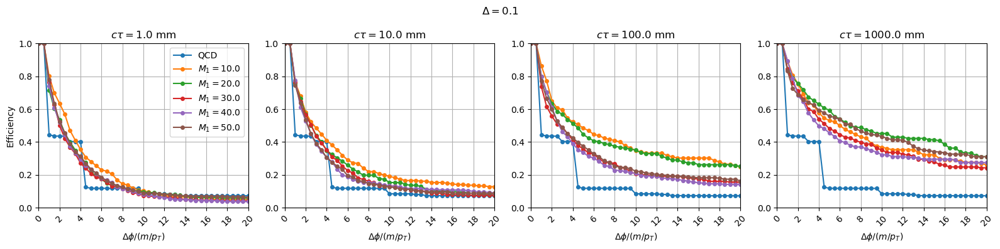

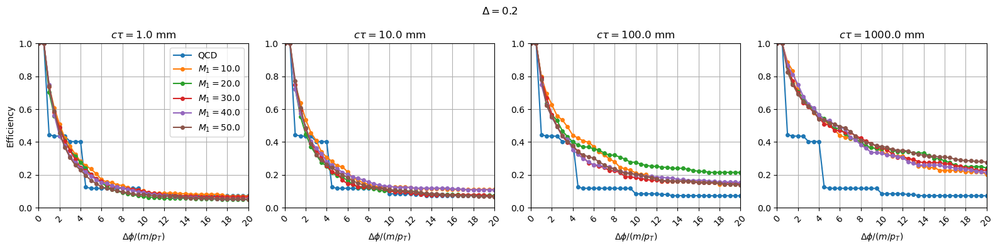

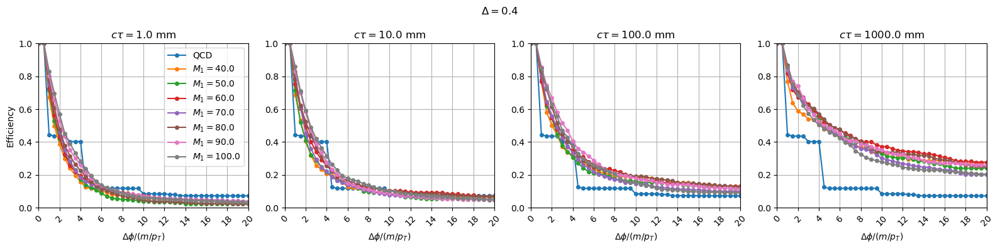

In [15]:
# vtx-MET dPhi / (m/pT) opposite cut
hname = "sel_vtx_METdPhi_over_mpT"
makeEffPlot(hname,[0,20],tickx=2,lessThan=False)

# Efficiency Ratios

/tmp/ipykernel_1913/3294065149.py:18: RuntimeWarning: invalid value encountered in true_divide
  plt.plot(x,eff/effb,label=r"$M_1 = {0}$".format(m1))


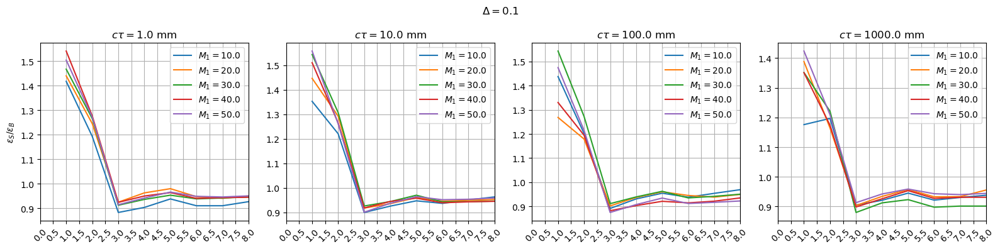

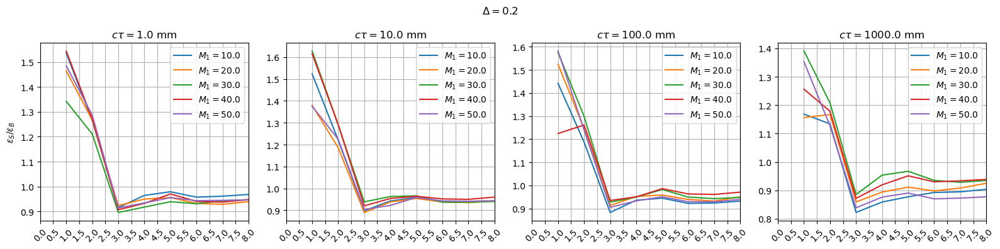

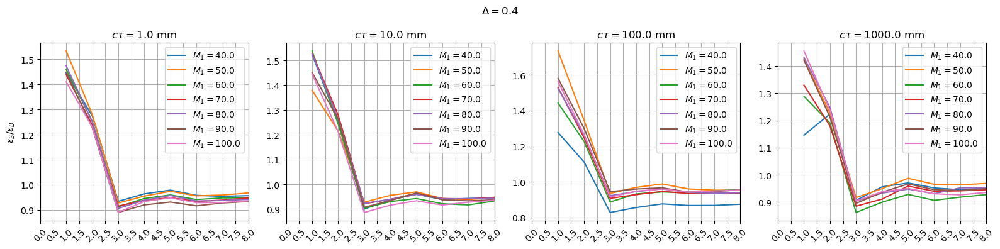

In [17]:
# electron 1 track chi2
hname = "sel_e1_trkChi2"
hb = qcd[hname][sum,cut,::2j]
#hb.plot1d(yerr=False)
#plt.yscale('log')
varAx = hb.axes[-1]
for delta in deltas:
    plt.figure(figsize=(16,4))
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        plt.subplot(1,4,i+1)
        plt.title(r"$c\tau = {0}$ mm".format(ct))
        xb,effb,ctsb = ptools.makeCutEff(hb,lessThan=True)
        for m1 in m1s:
            point = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            hs = sig[hname][point,cut,::2j]
            x,eff,cts = ptools.makeCutEff(hs,lessThan=True)
            plt.plot(x,eff/effb,label=r"$M_1 = {0}$".format(m1))
        #plt.yscale('log')
        #plt.ylim([0,1])
        plt.xlim([0,8])
        plt.xticks(ticks=np.arange(0,8.5,0.5),rotation=45)
        plt.legend(loc='best')
        plt.grid()
        if i==0:
            plt.ylabel(r"$\epsilon_S/\epsilon_B$")
    plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
    plt.tight_layout()